## Disha Balpande

# Task 4 Exploratory Data Analysis Terrorism



<b>Task Explanation</b><br>
Perform ‘Exploratory Data Analysis’ on dataset ‘Global Terrorism’<br>
As a security/defense analyst, try to find out the hot zone of terrorism.<br>
What all security issues and insights you can derive by EDA?<br>

In [2]:
import pandas as pd
import numpy as np # linear algebra
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np

In [4]:
df = pd.read_csv('globalterrorismdb_0718dist.csv')
df.head(5)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


As you see, there are 135 columns in this dataset. Some of them have too many *Null* values and also many of them don's suit my perpose in this notebook. So, dring renaming the column names (to have a cleaner vision), I just don't specify them as a column.
Also I creat a new column called **Casualities** which is made out of the summation of 'Killed' and 'Wounded':


In [5]:
df.rename(columns={'iyear':'Year','imonth':'Month','city':'City','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
df['Casualities'] = df.Killed + df.Wounded
df=df[['Year','Month','Day','Country','Region','City','latitude','longitude','AttackType','Killed','Wounded','Casualities','Target','Group','Target_type','Weapon_type']]

df.head()

,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Casualities,Target,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,1.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,1.0,Employee,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary


In [7]:
df.isnull().sum()

Year               0
Month              0
Day                0
Country            0
Region             0
City             434
latitude        4556
longitude       4557
AttackType         0
Killed         10313
Wounded        16311
Casualities    16874
Target           636
Group              0
Target_type        0
Weapon_type        0
dtype: int64

## Blood and Horror in last five decades:
Here I tried to write some sentences made of the exact numbers of dataset. It is an overall view of what is going on here:


In [8]:
print(f"""
    There are {df.Country.nunique()} countries from {df.Region.nunique()} regions covered in the dataset and terrorist atacks data in {df.Year.nunique()}
    years from {df.Year.min()} to {df.Year.max()}. Overally {df.index.nunique()} terrorist attacks are recorded here which caused about {int(df.Casualities.sum())} casualities
    consisted of {int(df.Killed.sum())} kills and {int(df.Wounded.sum())} wounded.
""")


    There are 205 countries from 12 regions covered in the dataset and terrorist atacks data in 47
    years from 1970 to 2017. Overally 181691 terrorist attacks are recorded here which caused about 872892 casualities
    consisted of 411868 kills and 523869 wounded.



## The most attacked countries and regions


In [9]:
print(f"The highest terrorist attacks were commited in {df.Country.value_counts().index[0]} with {df.Country.value_counts().max()} attacks")

print('The other 4 countries with highest terrorist attacks are:')
for i in range(1,5):
    print(f"{i+1}. {df.Country.value_counts().index[i]} with {df.Country.value_counts()[i]} attacks")

The highest terrorist attacks were commited in Iraq with 24636 attacks
The other 4 countries with highest terrorist attacks are:
2. Pakistan with 14368 attacks
3. Afghanistan with 12731 attacks
4. India with 11960 attacks
5. Colombia with 8306 attacks


In [10]:
print(f"The region that highest terrorist attacks were commited in {df.Region.value_counts().index[0]} with {df.Region.value_counts().max()} attacks")

print('The other regions orderd by highest terrorist attacks are:')
for i in range(1,7):
    print(f"{i+1}. {df.Region.value_counts().index[i]} with {df.Region.value_counts()[i]} attacks")

The region that highest terrorist attacks were commited in Middle East & North Africa with 50474 attacks
The other regions orderd by highest terrorist attacks are:
2. South Asia with 44974 attacks
3. South America with 18978 attacks
4. Sub-Saharan Africa with 17550 attacks
5. Western Europe with 16639 attacks
6. Southeast Asia with 12485 attacks
7. Central America & Caribbean with 10344 attacks


## Each-Year plots

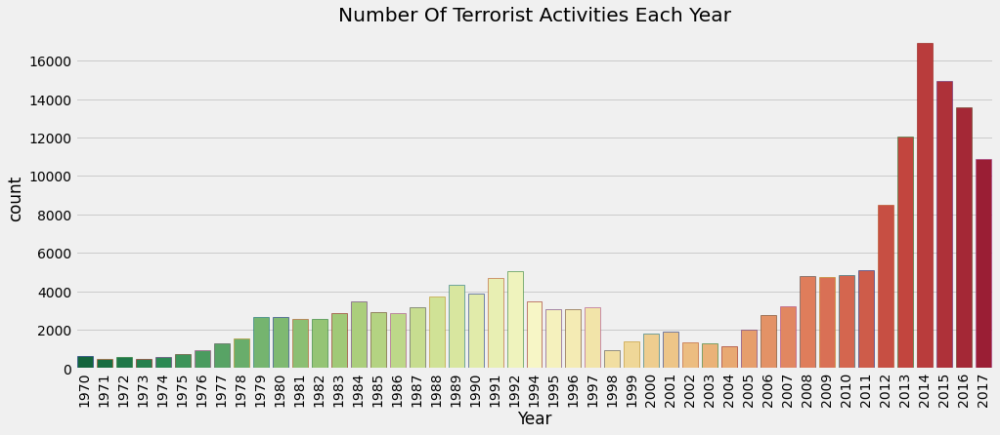

In [11]:
plt.subplots(figsize=(15,6))
sns.countplot('Year',data=df,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

# Year wise Casualities

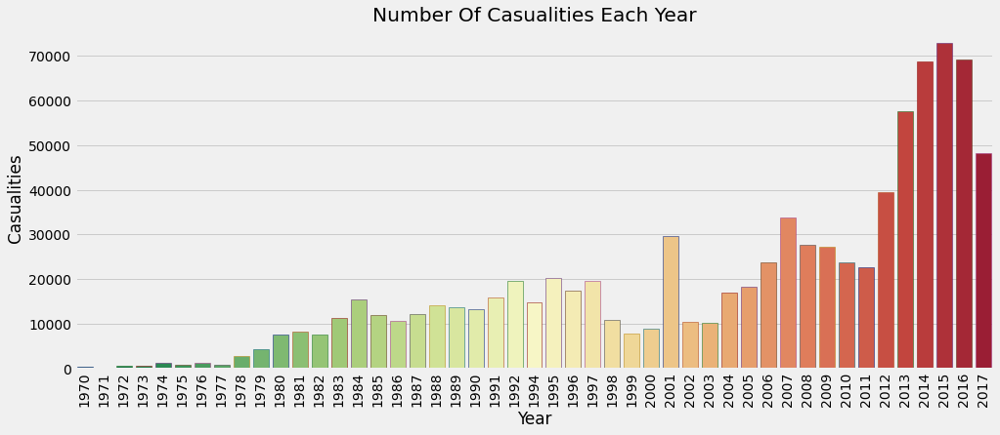

In [12]:
plt.subplots(figsize=(15,6))
year_cas = df.groupby('Year').Casualities.sum().to_frame().reset_index()
year_cas.columns = ['Year','Casualities']
sns.barplot(x=year_cas.Year, y=year_cas.Casualities, palette='RdYlGn_r',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number Of Casualities Each Year')
plt.show()

# Country wise Total Attacks

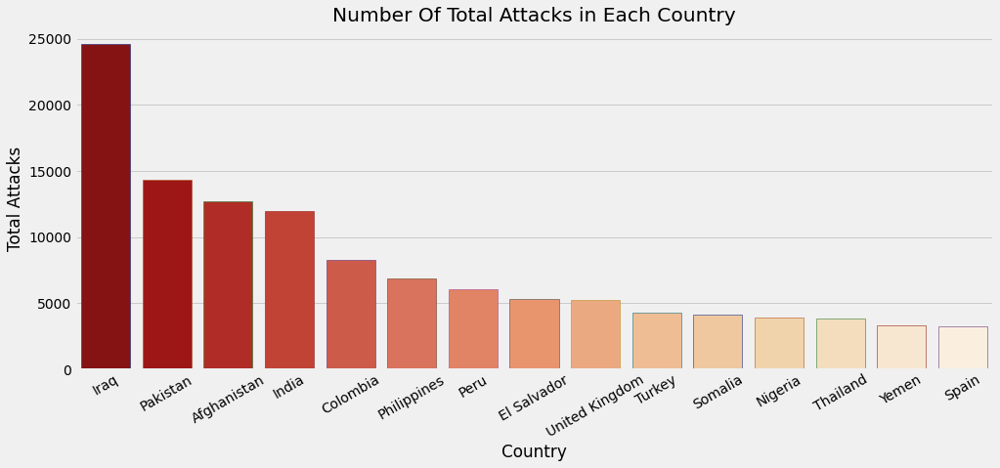

In [13]:
plt.subplots(figsize=(15,6))
country_attacks = df.Country.value_counts()[:15].reset_index()
country_attacks.columns = ['Country', 'Total Attacks']
sns.barplot(x=country_attacks.Country, y=country_attacks['Total Attacks'], palette= 'OrRd_r',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=30)
plt.title('Number Of Total Attacks in Each Country')
plt.show()

Here we observe the top 15 countries with the highest number of terrorist attacks. As we mentioned erlier, Iraq with 25 thousands of attacks and after that Pakistan, Afghanistan, India and Colombia are the top 5 countries. Among these countries, 7 are Aisian, 3 African and the others European and South American.

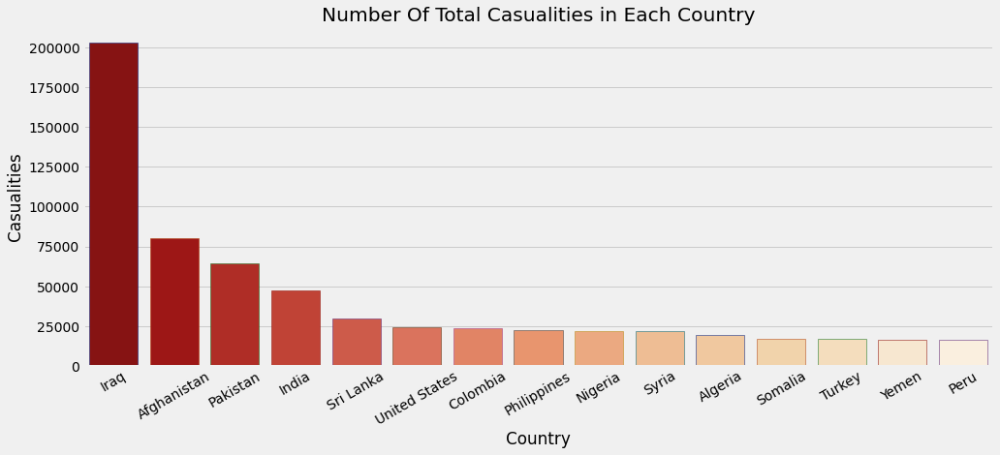

In [14]:
plt.subplots(figsize=(15,6))
count_cas = df.groupby('Country').Casualities.sum().to_frame().reset_index().sort_values('Casualities', ascending=False)[:15]
sns.barplot(x=count_cas.Country, y=count_cas.Casualities, palette= 'OrRd_r',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=30)
plt.title('Number Of Total Casualities in Each Country')
plt.show()

As you see, Iraq has the highest casualities of terrorist attacks during this 5 decade. Also there is a significant difference with the second country, which is Afghanistan. Roughly, 200 thousands of killed and wounded people. The composition of the countries is roughly the same, except that U.S. has substitued U.K. in this section, and few other differenc.

# Region wise Attack

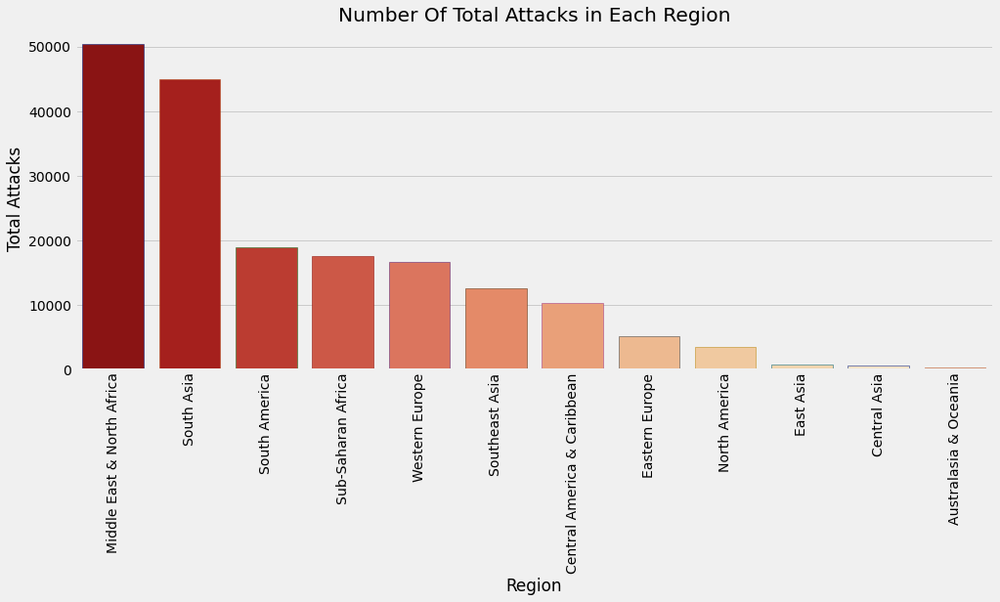

In [15]:
region_attacks = df.Region.value_counts().to_frame().reset_index()
region_attacks.columns = ['Region', 'Total Attacks']
plt.subplots(figsize=(15,6))
sns.barplot(x=region_attacks.Region, y=region_attacks['Total Attacks'], palette='OrRd_r', edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number Of Total Attacks in Each Region')
plt.show()

As we could expect, a large proportion of the Attacks were occured in Middle east and N Africa and South Africa as the summation of these to is roughly equal to the summation of all the other regions.

## Other Informative Plots

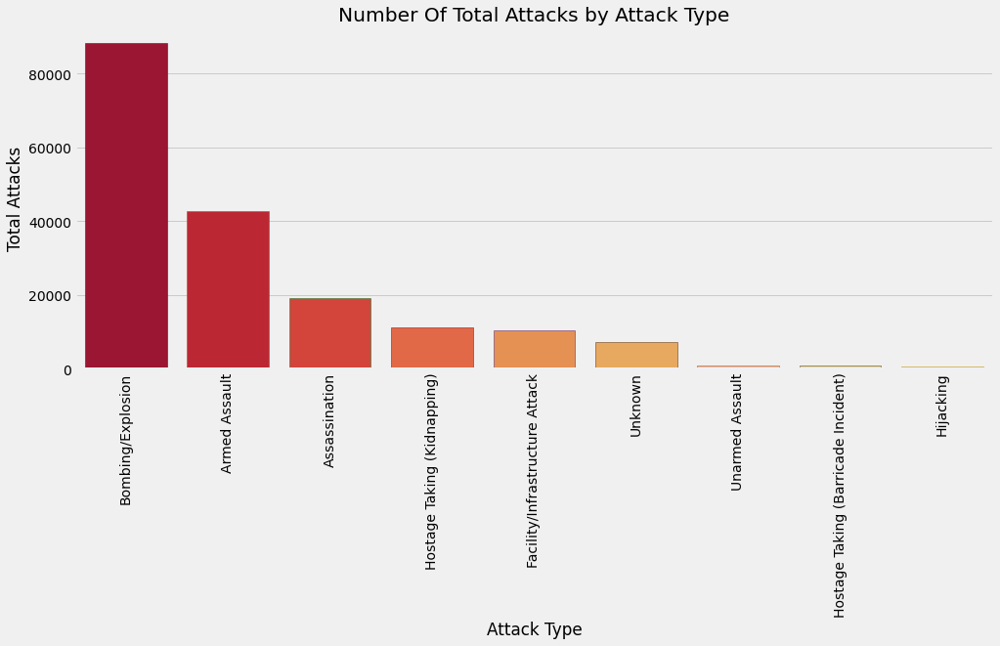

In [16]:
attack_type = df.AttackType.value_counts().to_frame().reset_index()
attack_type.columns = ['Attack Type', 'Total Attacks']
plt.subplots(figsize=(15,6))
sns.barplot(x=attack_type['Attack Type'], y=attack_type['Total Attacks'], palette='YlOrRd_r',
            edgecolor=sns.color_palette('dark', 10))
plt.xticks(rotation=90)
plt.title('Number Of Total Attacks by Attack Type')
plt.show()

In [38]:
baghdad_att = df.City[df.City=='Lima'].value_counts()
baghdad_cas = 76897

baghdad_att

Lima    2359
Name: City, dtype: int64

In [17]:
city_attacks = df.City.value_counts().to_frame().reset_index()
city_attacks.columns = ['City', 'Total Attacks']
city_cas = df.groupby('City').Casualities.sum().to_frame().reset_index()
city_cas.columns = ['City', 'Casualities']
# city_cas.drop('Unknown', axis=0, inplace=True)
city_tot = pd.merge(city_attacks, city_cas, how='left', on='City').sort_values('Total Attacks', ascending=False)[1:21]

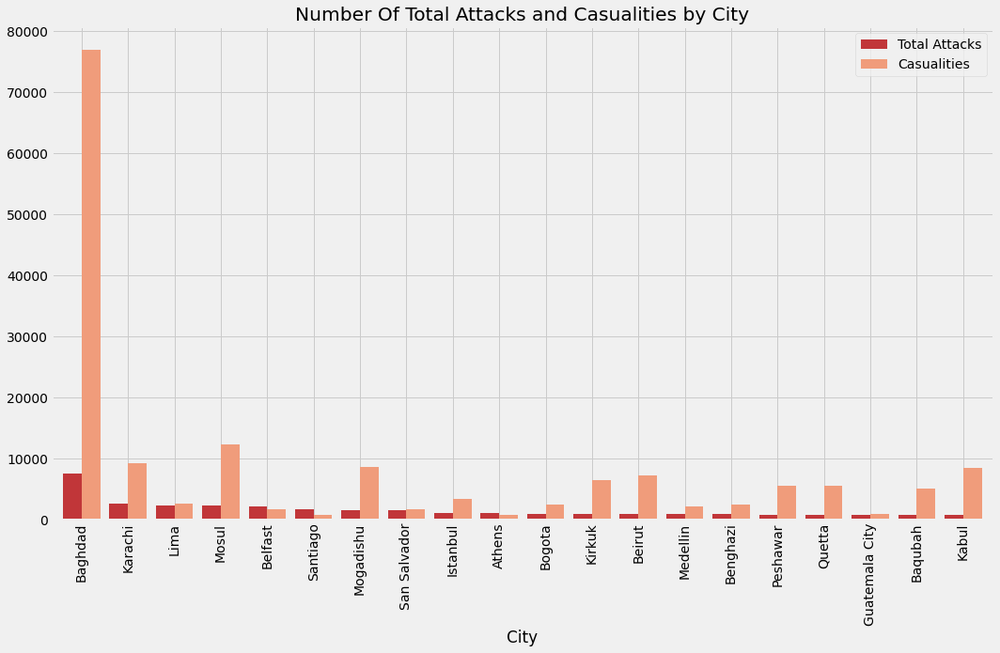

In [18]:
# fig = plt.figure()
# fig.subplots()
sns.set_palette('RdBu')
city_tot.plot.bar(x='City', width=0.8)
plt.xticks(rotation=90)
plt.title('Number Of Total Attacks and Casualities by City')
fig = plt.gcf()
fig.set_size_inches(16,9)
plt.show()


Here we can see the Total number of Attacks side by side of the Total Casualitities of each city. First, Baghdad, has the about 80 thousands of casualities, 10 times of the Attacks. It show us that the ratio of casualities to attcks is really high.

Let's take a look at the total numbers of attacks by terrorist group:

In [19]:
group_attacks = df.Group.value_counts().to_frame().drop('Unknown').reset_index()[:16]
group_attacks.columns = ['Terrorist Group', 'Total Attacks']
group_attacks

,Terrorist Group,Total Attacks
0,Taliban,7478
1,Islamic State of Iraq and the Levant (ISIL),5613
2,Shining Path (SL),4555
3,Farabundo Marti National Liberation Front (FMLN),3351
4,Al-Shabaab,3288
5,New People's Army (NPA),2772
6,Irish Republican Army (IRA),2671
7,Revolutionary Armed Forces of Colombia (FARC),2487
8,Boko Haram,2418
9,Kurdistan Workers' Party (PKK),2310


The three highest number of attacks were done by Taliban, ISIL and Shining Path, Communist party in Peru. 


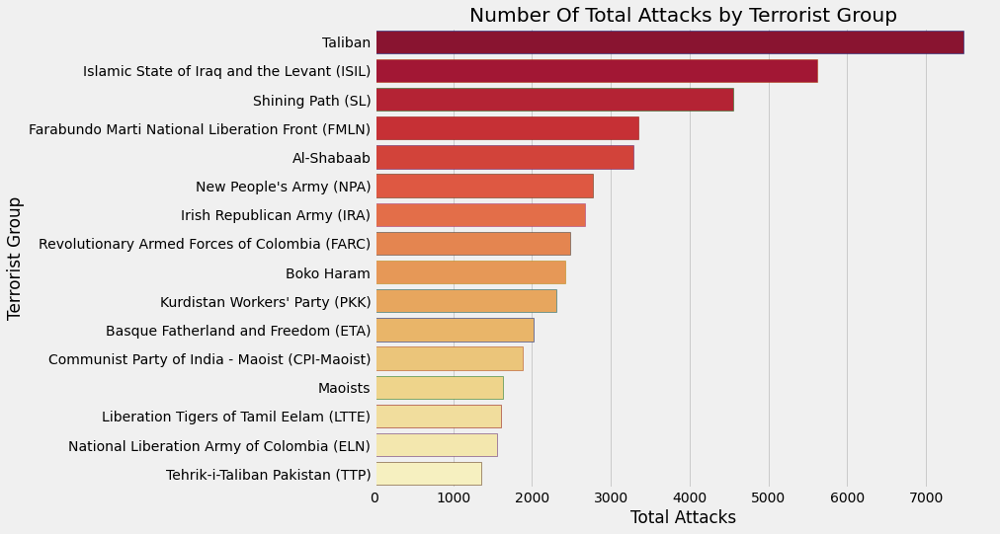

In [20]:
group_attacks = df.Group.value_counts().to_frame().drop('Unknown').reset_index()[:16]
group_attacks.columns = ['Terrorist Group', 'Total Attacks']
plt.subplots(figsize=(10,8))
sns.barplot(y=group_attacks['Terrorist Group'], x=group_attacks['Total Attacks'], palette='YlOrRd_r',
            edgecolor=sns.color_palette('dark', 10))
# plt.xticks()
plt.title('Number Of Total Attacks by Terrorist Group')
plt.show()

## Terrorist Groups Activity Trend


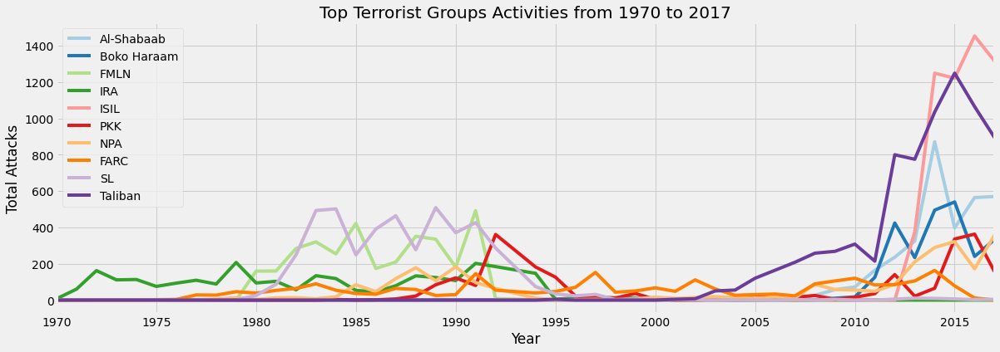

In [21]:
groups_10 = df[df.Group.isin(df.Group.value_counts()[1:11].index)]
pd.crosstab(groups_10.Year, groups_10.Group).plot(color=sns.color_palette('Paired', 10))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.xticks(range(1970, 2017, 5))
plt.ylabel('Total Attacks')
plt.title('Top Terrorist Groups Activities from 1970 to 2017')
plt.legend(labels=['Al-Shabaab',
                   'Boko Haraam',
                   'FMLN',
                   'IRA',
                   'ISIL',
                   'PKK',
                   'NPA',
                   'FARC',
                   'SL',
                   'Taliban'], loc='upper left')
plt.show()

## Interactive World-wide map of Terrorism

In [22]:
terror_fol=df.copy()
terror_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_fol=terror_fol[['latitude','longitude']][:5000]
country_fol=terror_fol['Country'][:5000]
city_fol=terror_fol['City'][:5000]
killed_fol=terror_fol['Killed'][:5000]
wound_fol=terror_fol['Wounded'][:5000]
def color_point(x):
    if x>=30:
        color='red'
    elif ((x>0 and x<30)):
        color='blue'
    else:
        color='green'
    return color   
def point_size(x):
    if (x>30 and x<100):
        size=2
    elif (x>=100 and x<500):
        size=8
    elif x>=500:
        size=16
    else:
        size=0.5
    return size   
map2 = folium.Map(location=[30,0],tiles='CartoDB dark_matter',zoom_start=2)
for point in location_fol.index:
    info='<b>Country: </b>'+str(country_fol[point])+'<br><b>City: </b>: '+str(city_fol[point])+'<br><b>Killed </b>: '+str(killed_fol[point])+'<br><b>Wounded</b> : '+str(wound_fol[point])
    iframe = folium.IFrame(html=info, width=200, height=200)
    folium.CircleMarker(list(location_fol.loc[point].values),popup=folium.Popup(iframe),radius=point_size(killed_fol[point]),color=color_point(killed_fol[point])).add_to(map2)
map2

In [40]:
def change_case(text):
    text = text.lower()
    return text[0].upper()+text[1:]

Let's take a look at Iran's dataset:

بیاید یه نگاهی به جدول دیتاست ایران بکنیم:

In [41]:
iran_attacks = df[df.Country=='Iran'].reset_index()
iran_attacks.City = iran_attacks.City.apply(change_case)
iran_attacks.head()

,index,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Casualities,Target,Group,Target_type,Weapon_type
0,334,1970,6,9,Iran,Middle East & North Africa,Tehran,35.724533,51.40519,Bombing/Explosion,NaN,NaN,NaN,EL AL Office,Popular Front for the Liberation of Palestine ...,Airports & Aircraft,Explosives
1,342,1970,6,11,Iran,Middle East & North Africa,Tehran,35.724533,51.40519,Bombing/Explosion,NaN,NaN,NaN,EL AL Office,Unknown,Airports & Aircraft,Explosives
2,529,1970,10,0,Iran,Middle East & North Africa,Tehran,35.724533,51.40519,Armed Assault,NaN,NaN,NaN,Bank,Siah KAL,Business,Firearms
3,549,1970,10,10,Iran,Middle East & North Africa,Tehran,35.724533,51.40519,Hijacking,0.0,1.0,1.0,B-727,Iranians,Airports & Aircraft,Unknown
4,584,1970,11,0,Iran,Middle East & North Africa,Tehran,35.724533,51.40519,Hostage Taking (Kidnapping),0.0,0.0,0.0,"Mc Arthur, U.S. Ambassador",Unknown,Government (Diplomatic),Unknown


In [42]:
print(f"""
    A total number of {iran_attacks.City.nunique()} cities attacked by {iran_attacks.Group.nunique()} different terrorist groups covered in the dataset between
    {iran_attacks.Year.min()} to {iran_attacks.Year.max()}. Overally {iran_attacks.index.nunique()} terrorist attacks are recorded here which caused about {int(iran_attacks.Casualities.sum())} casualities
    consisted of {int(iran_attacks.Killed.sum())} kills and {int(iran_attacks.Wounded.sum())} wounded.
""")


    A total number of 119 cities attacked by 73 different terrorist groups covered in the dataset between
    1970 to 2017. Overally 684 terrorist attacks are recorded here which caused about 5623 casualities
    consisted of 1673 kills and 4029 wounded.



In [43]:
iran_attacks.City.value_counts()

Tehran          282
Unknown          59
Ahvaz            33
Khorramshahr     29
Mashhad          21
               ... 
Amol              1
Salmas            1
Zom               1
Zara              1
Zanjan            1
Name: City, Length: 119, dtype: int64

In [44]:
# iran_attacks.to_csv('iran_terror_v2.csv')

In [45]:
iran_attacks.isnull().sum()

index            0
Year             0
Month            0
Day              0
Country          0
Region           0
City             0
latitude        28
longitude       28
AttackType       0
Killed         103
Wounded        112
Casualities    114
Target           4
Group            0
Target_type      0
Weapon_type      0
dtype: int64

In [46]:
print(f"The highest terrorist attacks were commited in {iran_attacks.City.value_counts().index[0]} with {iran_attacks.City.value_counts().max()} attacks")

print('The other 4 Iranian cities with highest terrorist attacks are:')
for i in range(2,6):
    print(f"{i}. {iran_attacks.City.value_counts().index[i]} with {iran_attacks.City.value_counts()[i]} attacks")

The highest terrorist attacks were commited in Tehran with 282 attacks
The other 4 Iranian cities with highest terrorist attacks are:
2. Ahvaz with 33 attacks
3. Khorramshahr with 29 attacks
4. Mashhad with 21 attacks
5. Zahedan with 20 attacks


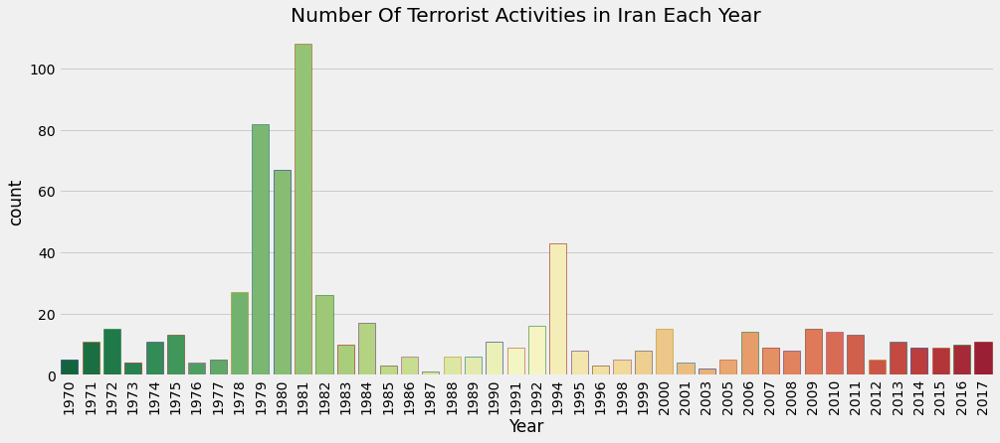

In [47]:
plt.subplots(figsize=(15,6))
sns.countplot('Year',data=iran_attacks,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities in Iran Each Year')
plt.show()

Versus the global version, Iran had it's peak during the 80s, when there had been a revolution and after that a war going on in the country between Iran and Iraq. The highest numbers are on 1979, 1980 and 1981.


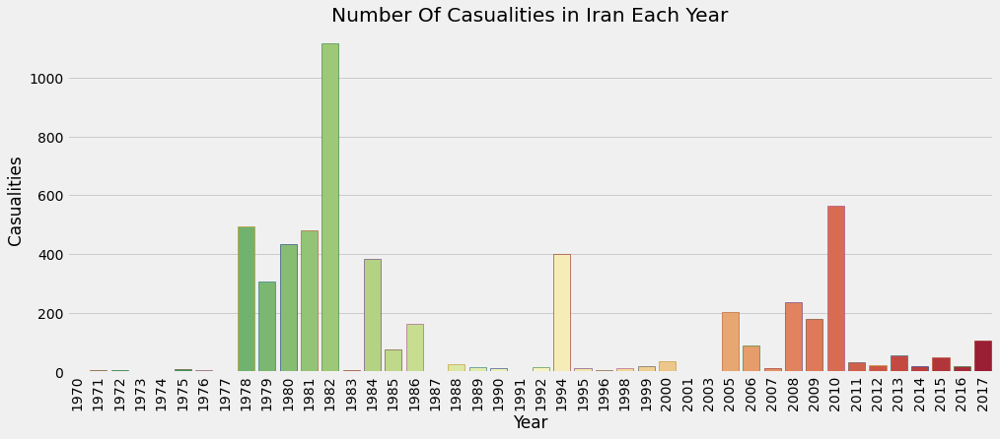

In [48]:
plt.subplots(figsize=(15,6))
year_cas_iran = iran_attacks.groupby('Year').Casualities.sum().to_frame().reset_index()
year_cas_iran.columns = ['Year','Casualities']
sns.barplot(x=year_cas_iran.Year, y=year_cas_iran.Casualities, palette='RdYlGn_r',
            edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number Of Casualities in Iran Each Year')
plt.show()

The peak of Casualities of terrorist attacks in Iran, is 1982 with more than 1000 killed and wounded.

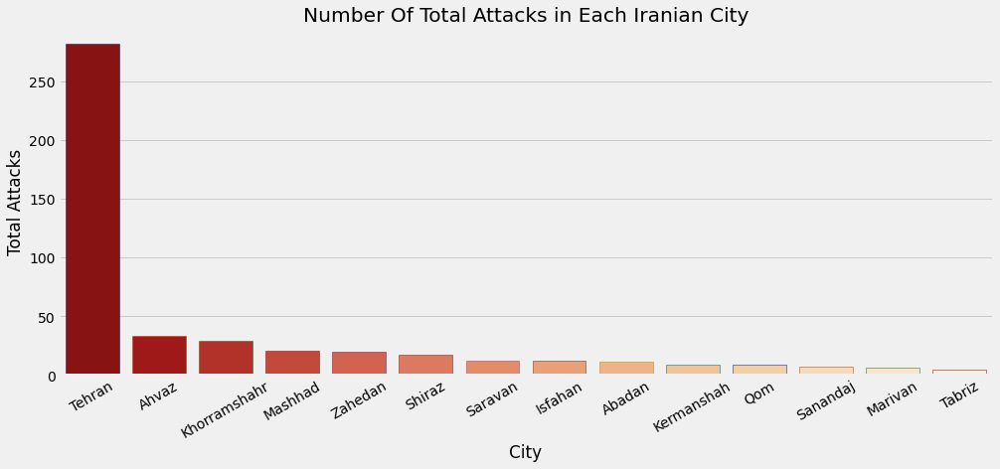

In [49]:
plt.subplots(figsize=(15,6))
city_attacks_iran = iran_attacks.City.value_counts()[:15].reset_index()
city_attacks_iran.columns = ['City', 'Total Attacks']
city_attacks_iran.drop(1, inplace=True)
sns.barplot(x=city_attacks_iran.City, y=city_attacks_iran['Total Attacks'], palette='OrRd_r',
            edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=30)
plt.title('Number Of Total Attacks in Each Iranian City')
plt.show()

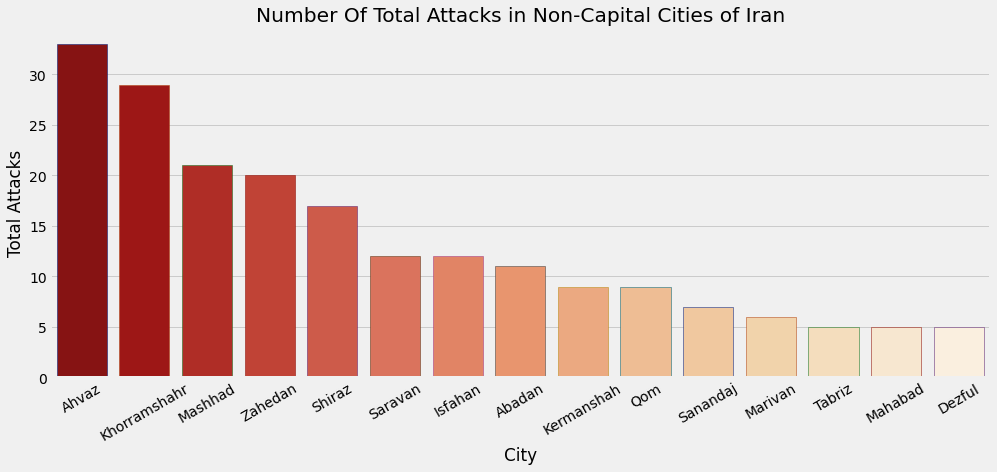

In [50]:
plt.subplots(figsize=(15,6))
city_attacks_iran = iran_attacks.City.value_counts()[:17].reset_index()
city_attacks_iran.columns = ['City', 'Total Attacks']
city_attacks_iran.drop([0, 1], inplace=True)
sns.barplot(x=city_attacks_iran.City, y=city_attacks_iran['Total Attacks'], palette='OrRd_r',
            edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=30)
plt.title('Number Of Total Attacks in Non-Capital Cities of Iran')
plt.show()

Ahvaz and Khorramshahr (which are in the same south-western province) and after them Mashhad and Zahedan (which are respectively North-eastern and south-eastern cities of the country.

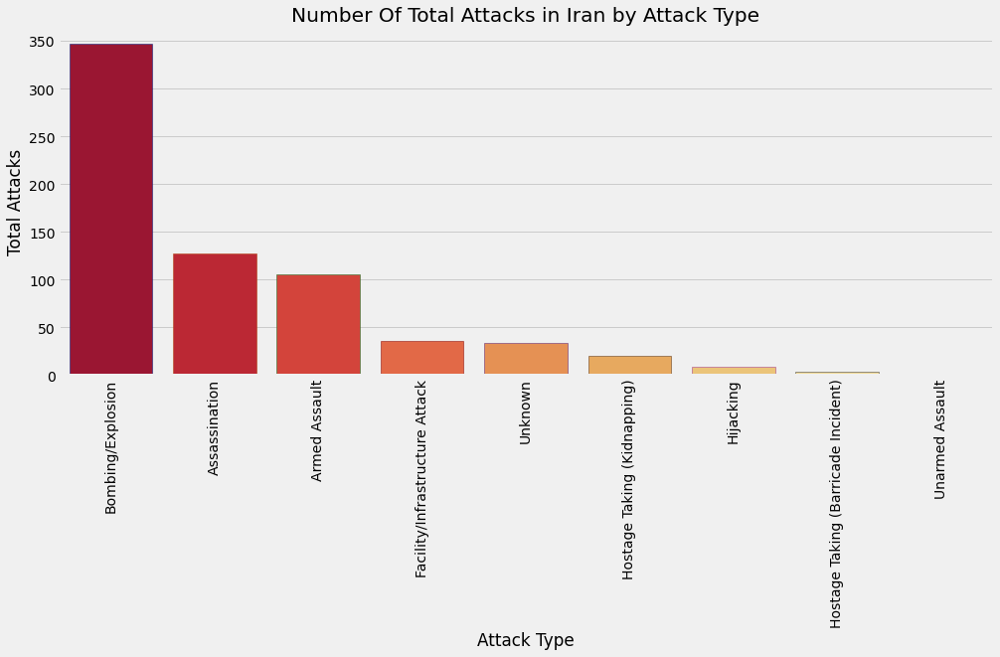

In [51]:
ir_attack_type = iran_attacks.AttackType.value_counts().to_frame().reset_index()
ir_attack_type.columns = ['Attack Type', 'Total Attacks']
plt.subplots(figsize=(15,6))
sns.barplot(x=ir_attack_type['Attack Type'], y=ir_attack_type['Total Attacks'], palette='YlOrRd_r',
            edgecolor=sns.color_palette('dark', 10))
plt.xticks(rotation=90)
plt.title('Number Of Total Attacks in Iran by Attack Type')
plt.show()

In [52]:
ir_city_attacks = iran_attacks.City.value_counts().to_frame().reset_index()
ir_city_attacks.columns = ['City', 'Total Attacks']
ir_city_cas = iran_attacks.groupby('City').Casualities.sum().to_frame().reset_index()
ir_city_cas.columns = ['City', 'Casualities']
# city_cas.drop('Unknown', axis=0, inplace=True)
ir_city_tot = pd.merge(ir_city_attacks, ir_city_cas, how='left', on='City').sort_values('Casualities',
                                                                                  ascending=False)[1:12]
# ir_city_tot.drop(1, inplace=True)
ir_city_tot

,City,Total Attacks,Casualities
9,Abadan,11,494.0
5,Zahedan,20,455.0
2,Ahvaz,33,393.0
3,Khorramshahr,29,335.0
6,Shiraz,17,259.0
4,Mashhad,21,188.0
11,Qom,9,144.0
15,Mahabad,5,132.0
7,Saravan,12,80.0
10,Kermanshah,9,79.0


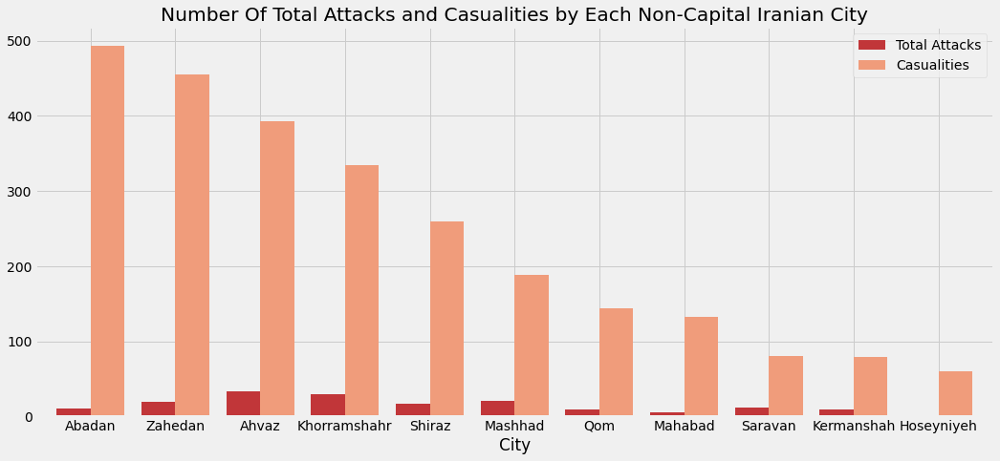

In [53]:
# fig = plt.figure()
# fig.subplots()
sns.set_palette('RdBu')
ir_city_tot.plot.bar(x='City', width=0.8)
plt.xticks(rotation=90)
plt.title('Number Of Total Attacks and Casualities by Each Non-Capital Iranian City')
fig = plt.gcf()
fig.set_size_inches(16,7)
plt.xticks(rotation=0)
plt.show()


In [54]:
ir_group_attacks = iran_attacks.Group.value_counts().to_frame().drop('Unknown').reset_index()[:8]
ir_group_attacks.columns = ['Terrorist Group', 'Total Attacks']
ir_group_attacks

,Terrorist Group,Total Attacks
0,Mujahedin-e Khalq (MEK),98
1,Arab Separatists,23
2,Forqan Group,18
3,Counter-revolutionaries,15
4,Kurdistan Free Life Party,14
5,Jaish al-Adl,14
6,Jundallah (Iran),13
7,Armenian Secret Army for the Liberation of Arm...,12


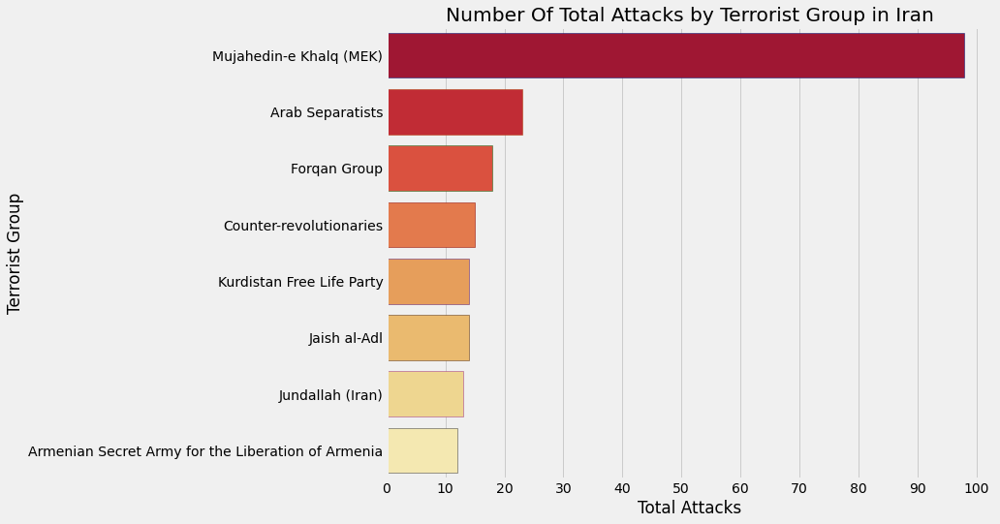

In [55]:
plt.subplots(figsize=(10,8))
sns.barplot(y=ir_group_attacks['Terrorist Group'], x=ir_group_attacks['Total Attacks'], palette='YlOrRd_r',
            edgecolor=sns.color_palette('dark', 10))
plt.xticks(range(0,110,10))
plt.title('Number Of Total Attacks by Terrorist Group in Iran')
plt.show()

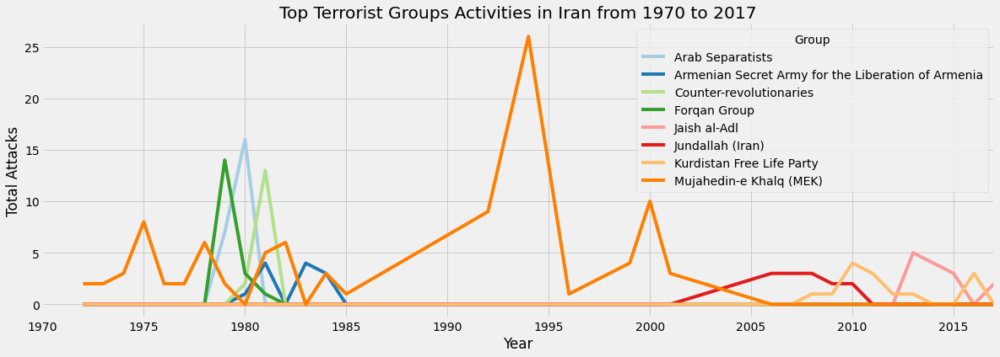

In [56]:
ir_groups_10 = iran_attacks[iran_attacks.Group.isin(iran_attacks.Group.value_counts()[1:9].index)]
pd.crosstab(ir_groups_10.Year, ir_groups_10.Group).plot(color=sns.color_palette('Paired', 10))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.xticks(range(1970, 2017, 5))
plt.ylabel('Total Attacks')
plt.title('Top Terrorist Groups Activities in Iran from 1970 to 2017')
plt.show()

## Animation of Spreading Terrorist Activities in Iran by Year


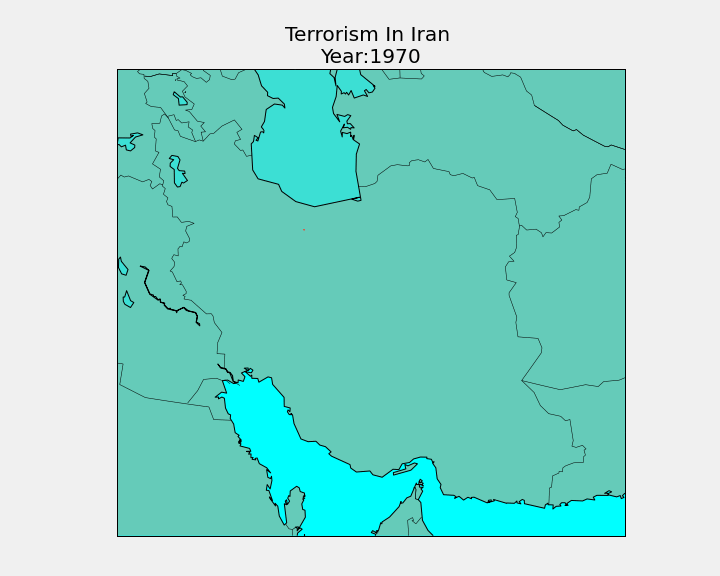

In [58]:
fig = plt.figure(figsize = (10,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In Iran '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=44,llcrnrlat=24,urcrnrlon=67,urcrnrlat=41,lat_0=32,lon_0=53)
    lat_gif=list(iran_attacks[iran_attacks['Year']==Year].latitude)
    long_gif=list(iran_attacks[iran_attacks['Year']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(iran_attacks[iran_attacks['Year']==Year].Killed,iran_attacks[iran_attacks['Year']==Year].Wounded)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
ani = animation.FuncAnimation(fig,animate,list(iran_attacks.Year.unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))